In [1]:
import os
import sys
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt

import IPython.display
IPython.display.display(IPython.display.HTML("<style>.container { width:90% !important; }</style>"))

sys.path.append('./../src/')
from manuscript import sankey_side_by_side as sankey
from manuscript import clustering, datasets, inout, export

pd.options.display.max_columns = 200
mpl.rcParams["figure.figsize"] = (10, 8)
mpl.rcParams["pdf.fonttype"] = 42
mpl.rcParams["font.family"] = "Arial"

fonts = inout.get_resource_path('fonts')
for f in os.listdir(fonts):
    if f.endswith(".ttf"):
        mpl.font_manager.fontManager.addfont(f"{fonts}/{f}")
        
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

In [2]:
user = 'general'     # defines top hierarchy of output folder
outfolder = '05_join_clusters_umap'    # name of notebook
save = True

def dump_table(df, name):
    if save:
        export.full_frame(
            user, 
            f'{outfolder}/{name}', 
            df, 
            index=True,
            date=True
        )

def dump_figure(name):
    if save:
        export.image(
            user,
            f'{outfolder}/{name}',
        )

In [3]:
#load umap coordinates 

umap = pd.read_csv(
    inout.get_material_path('general/04_clustering/Similarity-umap_220920_1628.csv.gz'), 
    index_col=0)

In [4]:
#load cluster information
clusters = pd.read_csv(
    inout.get_material_path('general/04_clustering/Similarity-clusters_220920_1630.csv.gz'), 
    index_col=0)

In [5]:
clusters.sort_values(["Patient_id", "ICU_stay", "ICU_day"], inplace=True)

In [6]:
#merge
data = pd.merge(umap, clusters)

In [7]:
data = data.set_index(
    data.Patient_id.astype(str) + "/" + data.ICU_stay.astype(str) + "/" + data.ICU_day.astype(str)
)
data.drop(columns=['index'], inplace=True)

In [8]:
# we want the clusters numbered in increasing mortality
# want the clusters 1-14 rather than 0-13

data['clusters']=data['cluster_order']+1


In [9]:
data.drop(columns=['cluster', 'cluster_order'], inplace=True)

In [10]:
# Mortality per cluster

In [10]:
cluster_mortality = pd.read_csv(
    inout.get_material_path('general/04_clustering/Similarity-cluster_mortality_220920_1630.csv.gz'), 
    index_col=0)

In [11]:
cluster_mortality['clusters']=cluster_mortality['index']+1

In [12]:
cluster_mortality = cluster_mortality[['clusters','mortality']]

In [13]:
dump_table(cluster_mortality, '05_cluster_mortality_renumbered.csv.gz')

In [14]:
# Previous and next clusters

In [15]:
data["prev_cluster"] = data.groupby(["Patient_id", "ICU_stay"]).shift(1).clusters
data["next_cluster"] = data.groupby(["Patient_id", "ICU_stay"]).shift(-1).clusters
data.prev_cluster = data.prev_cluster.fillna(-1).astype(int)
data.next_cluster = data.next_cluster.fillna(-1).astype(int)
data["is_transition"] = (data.clusters != data.next_cluster) & (data.next_cluster != -1)

In [16]:
data.drop(columns=['level_0'], inplace=True)

In [17]:
dump_table(data, '05_data_umap_clusters.csv.gz')

# Plots, feature plots

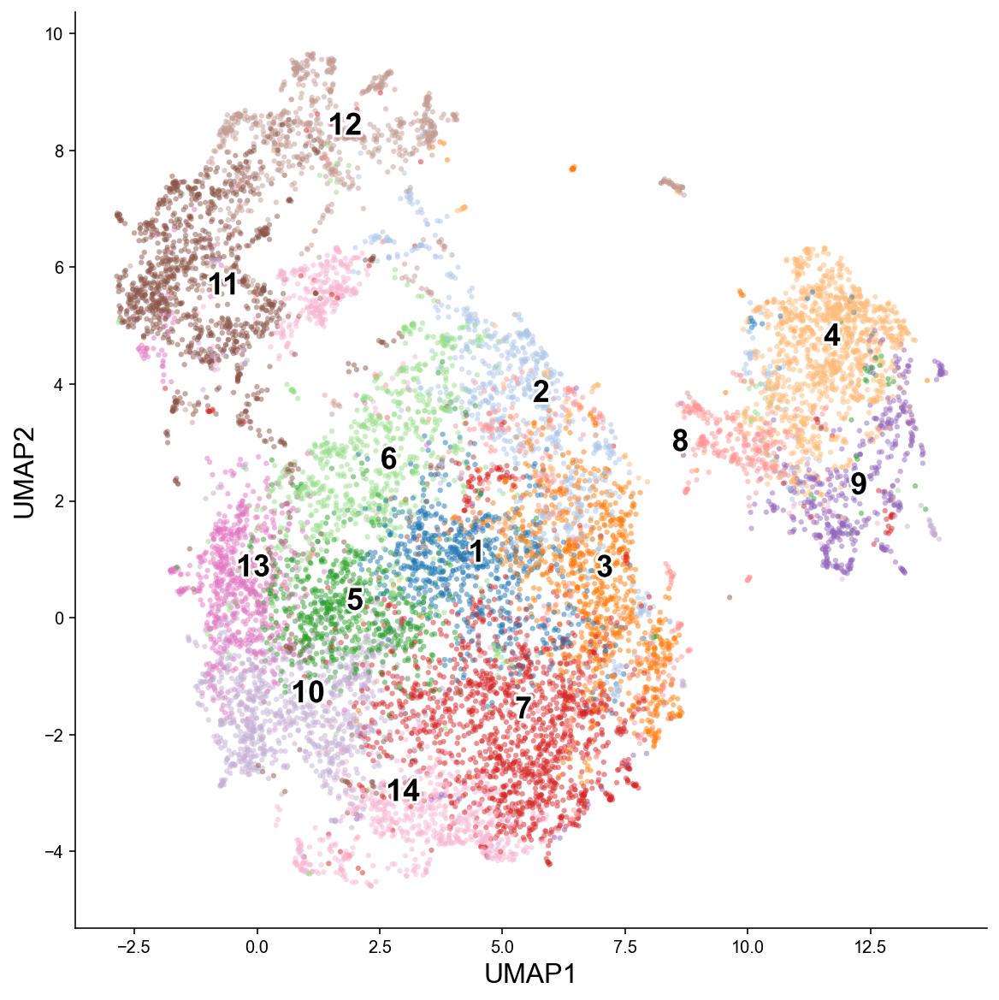

In [19]:
fig, ax = plt.subplots(constrained_layout=True, figsize=(8, 8))
scatter = ax.scatter(
    data.umap1, 
    data.umap2, 
    s=10, 
    c=[mpl.cm.tab20(i - 1) for i in data.clusters],
    alpha=0.5,
    ec=None
)
for c in data.clusters.unique():
    num = data.clusters[data.clusters == c].values[0]
    u1 = data.umap1[data.clusters == c].median()
    u2 = data.umap2[data.clusters == c].median()
    ax.text(u1, u2, c, size=18, weight="bold", path_effects=[
        mpl.patheffects.Stroke(linewidth=3, foreground="white"),
        mpl.patheffects.Normal()
    ])
ax.set_xlabel("UMAP1", size=16)
ax.set_ylabel("UMAP2", size=16)
ax.collections[0].set_rasterized(True)
ax.spines[["top", "right"]].set_visible(False)

dump_figure('Similarity_umap_renumbered.pdf')

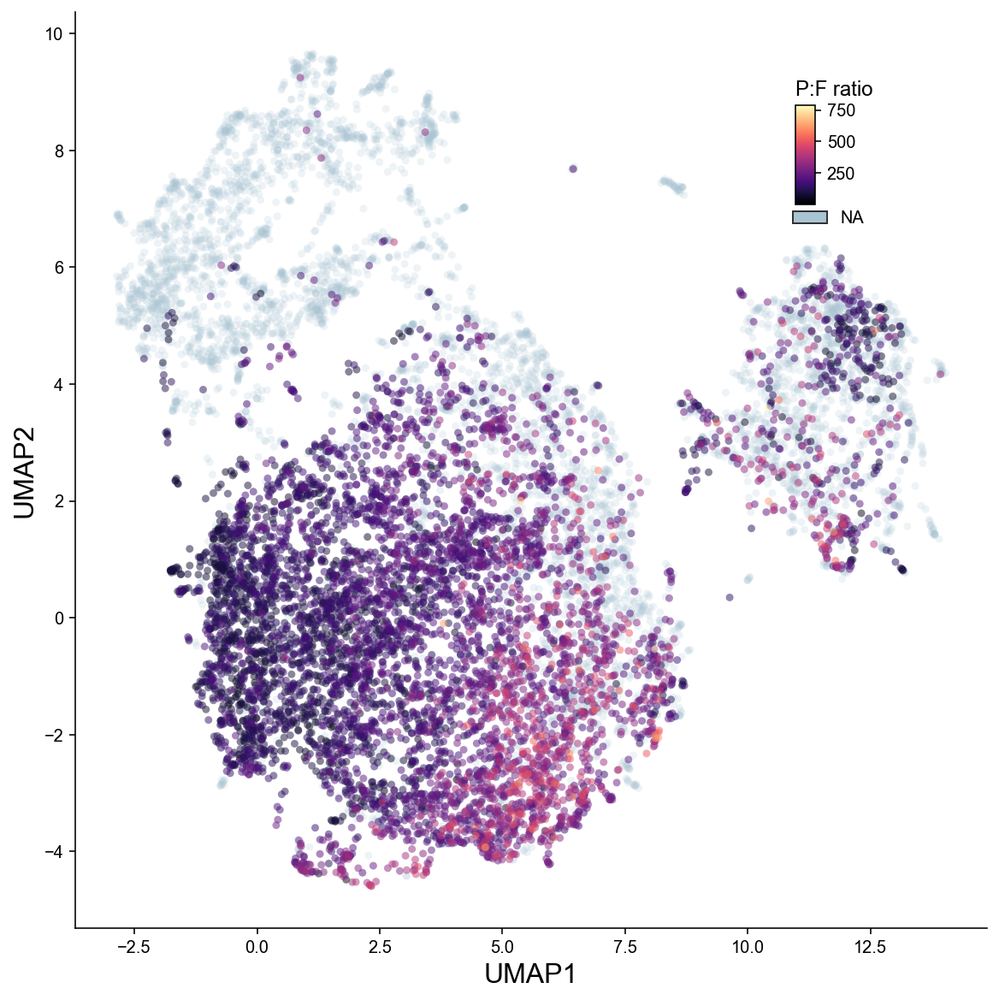

In [20]:
clustering.feature_plot(data, "PaO2FIO2_ratio", "P:F ratio")
dump_figure('pfratio.pdf')

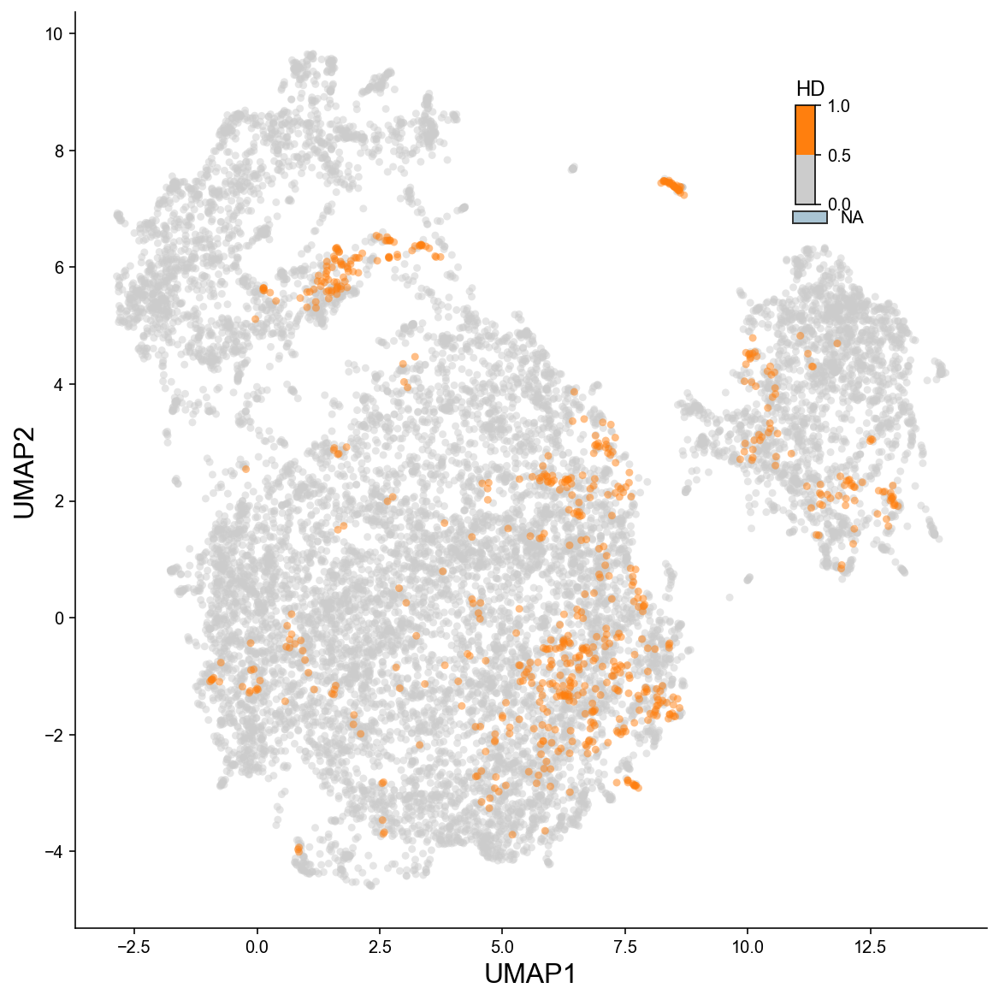

In [21]:
clustering.feature_plot(data, "Hemodialysis_flag", 'HD', cmap=mpl.colors.ListedColormap(["#ccc", "tab:orange"]))
dump_figure('hemodialysis.pdf')

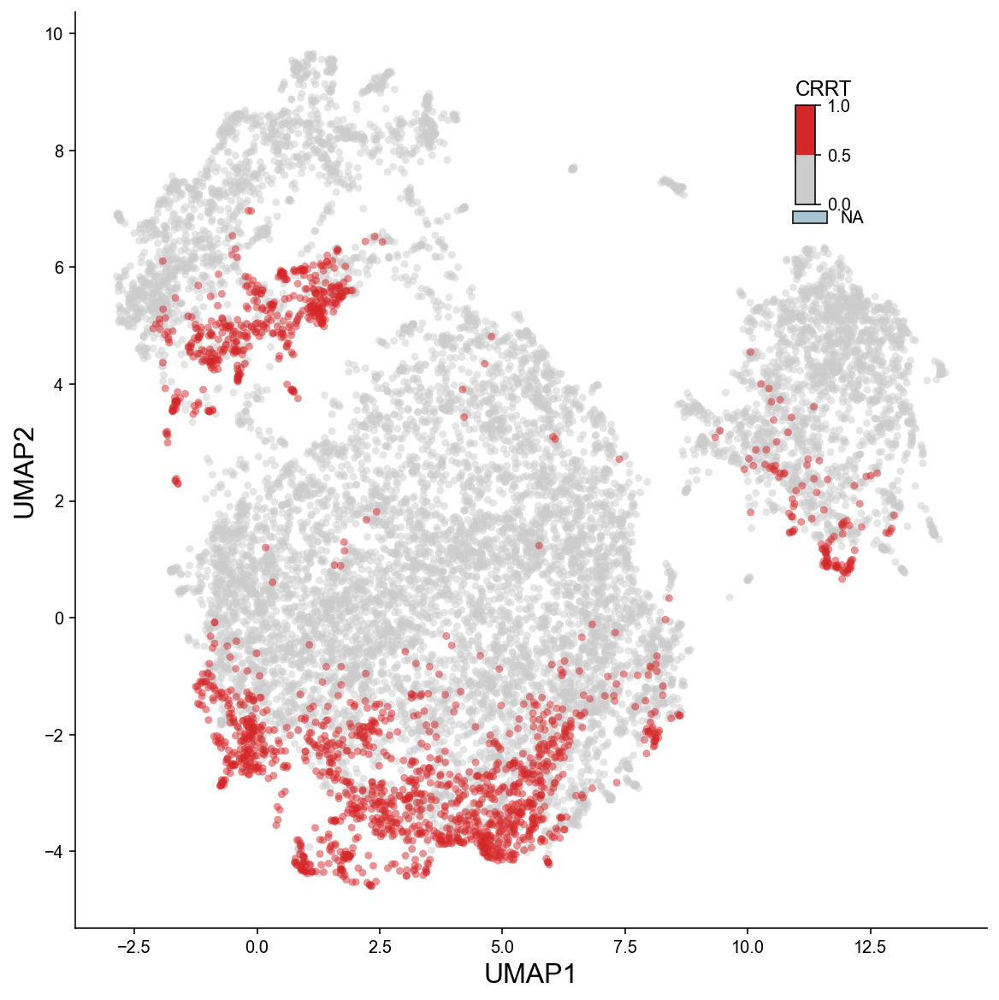

In [22]:
clustering.feature_plot(data, "CRRT_flag", 'CRRT', cmap=mpl.colors.ListedColormap(["#ccc", "tab:red"]))
dump_figure('crrt.pdf')

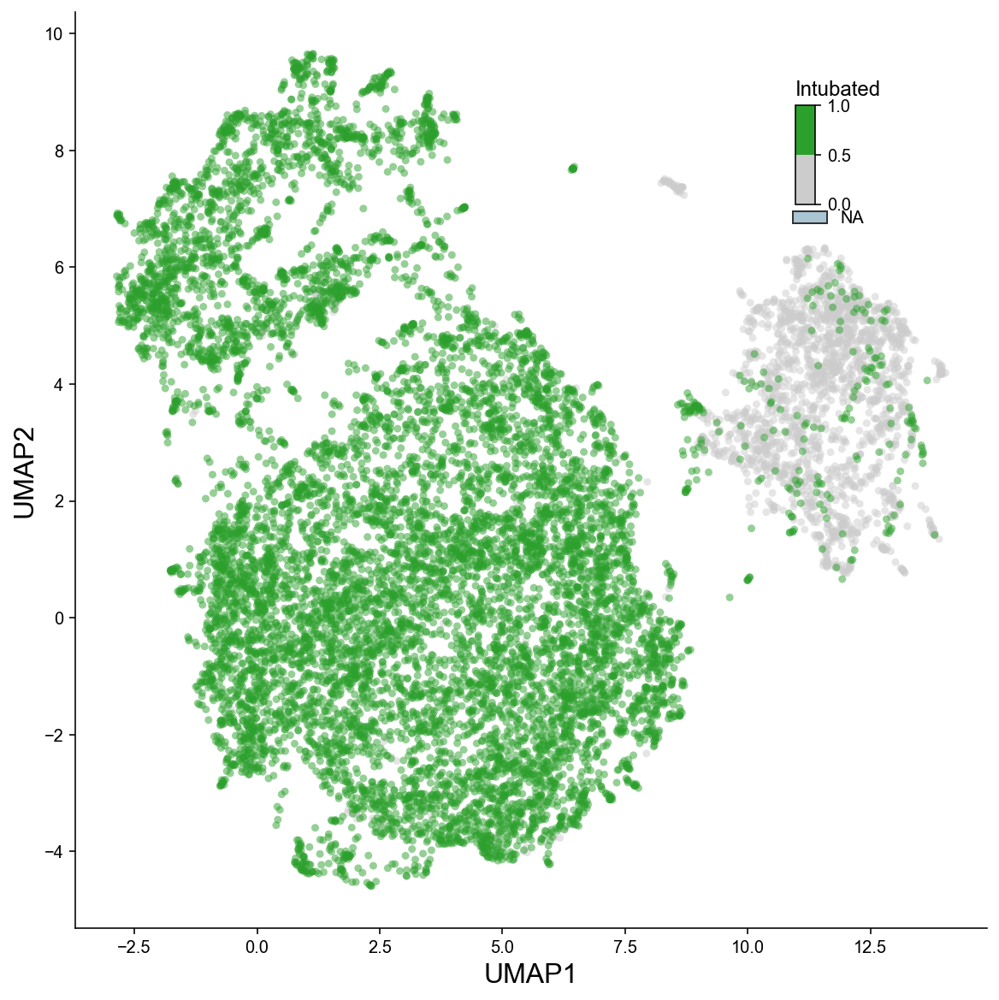

In [23]:
clustering.feature_plot(data, "Intubation_flag", 'Intubated', cmap=mpl.colors.ListedColormap(["#ccc", "tab:green"]))
dump_figure('intubated.pdf')

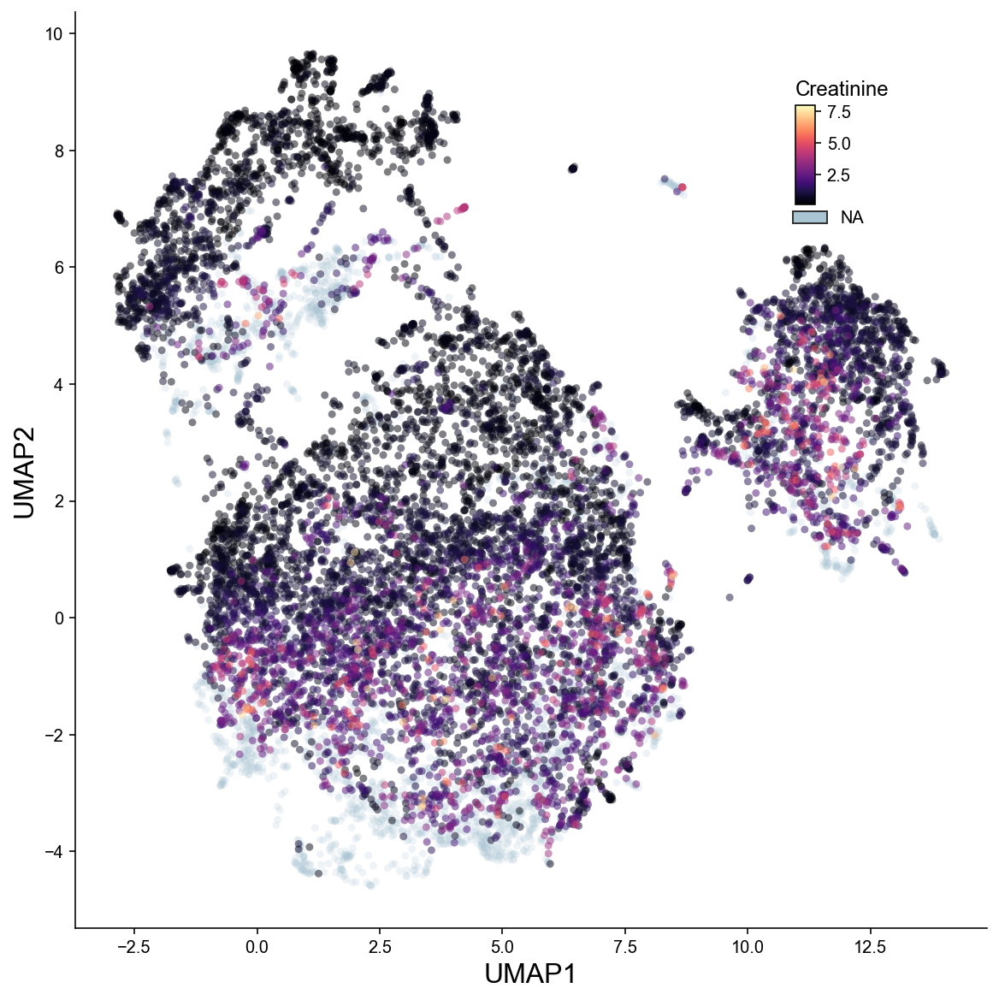

In [24]:
clustering.feature_plot(data, "Creatinine", "Creatinine")
dump_figure('creatinine.pdf')

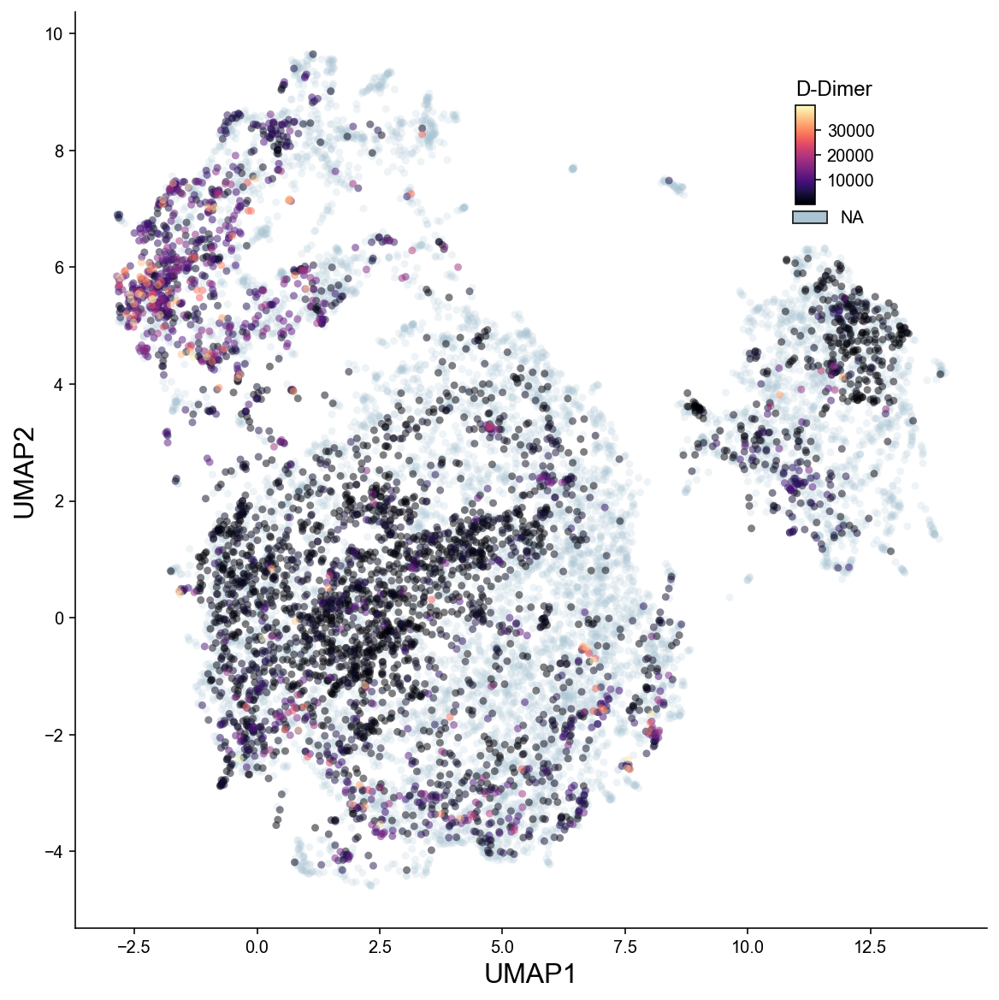

In [25]:
clustering.feature_plot(data, "D_dimer", "D-Dimer")
dump_figure('ddimer.pdf')

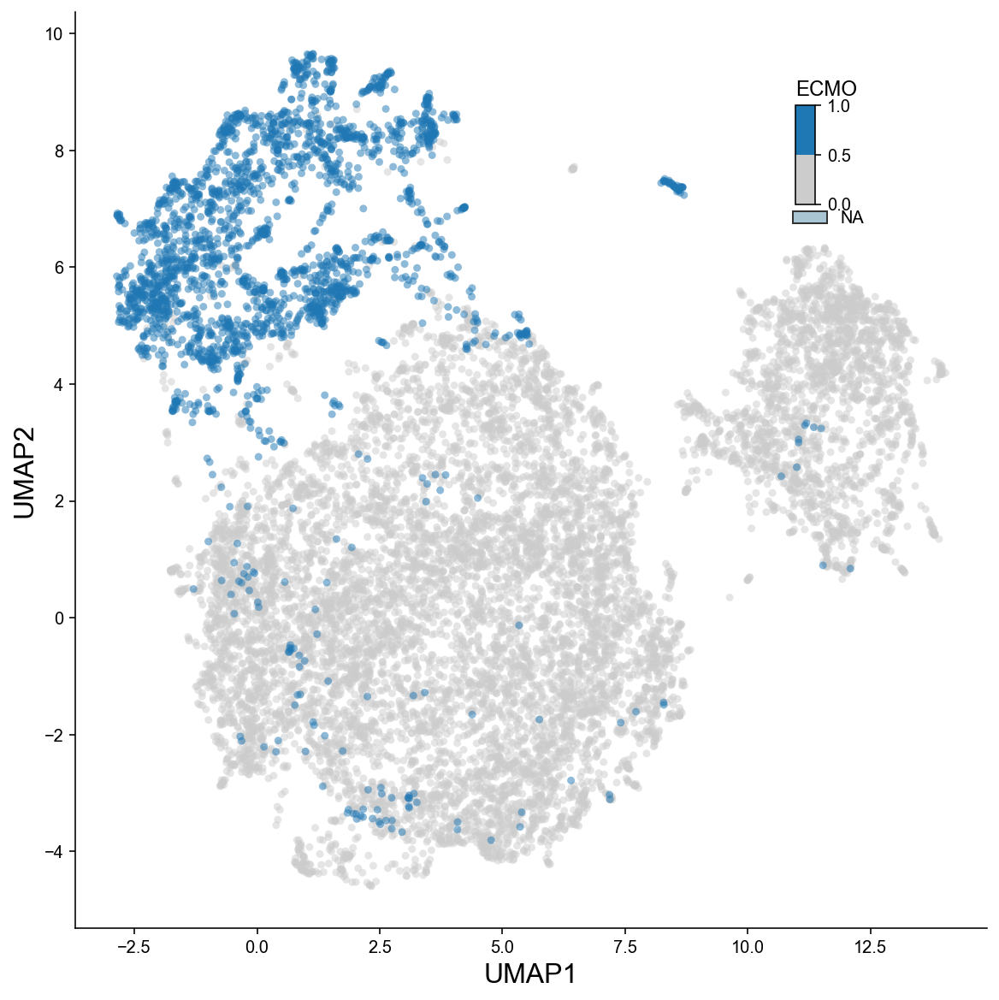

In [26]:
clustering.feature_plot(data, "ECMO_flag", "ECMO", cmap=mpl.colors.ListedColormap(["#ccc", "tab:blue"]))
dump_figure('ecmo.pdf')

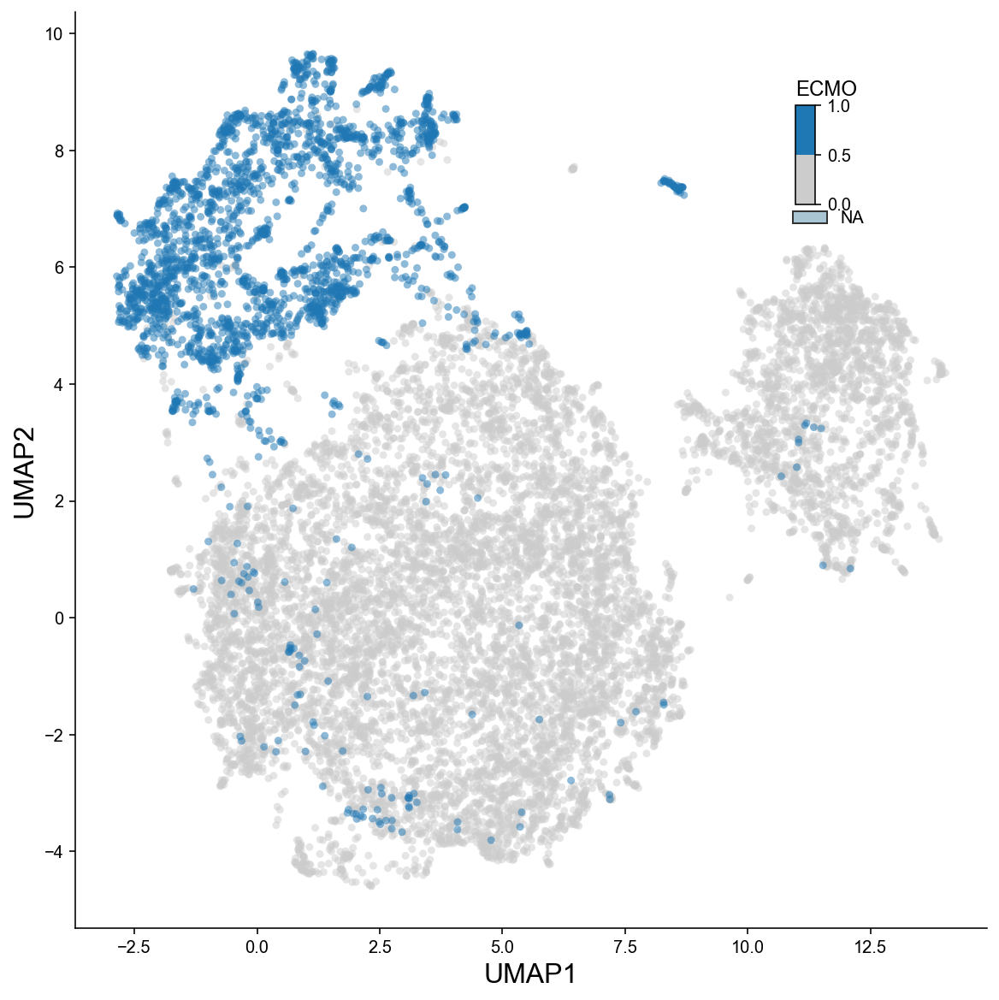

In [27]:
clustering.feature_plot(data, "ECMO_flag", "ECMO", cmap=mpl.colors.ListedColormap(["#ccc", "tab:blue"]))
dump_figure('ecmo.pdf')

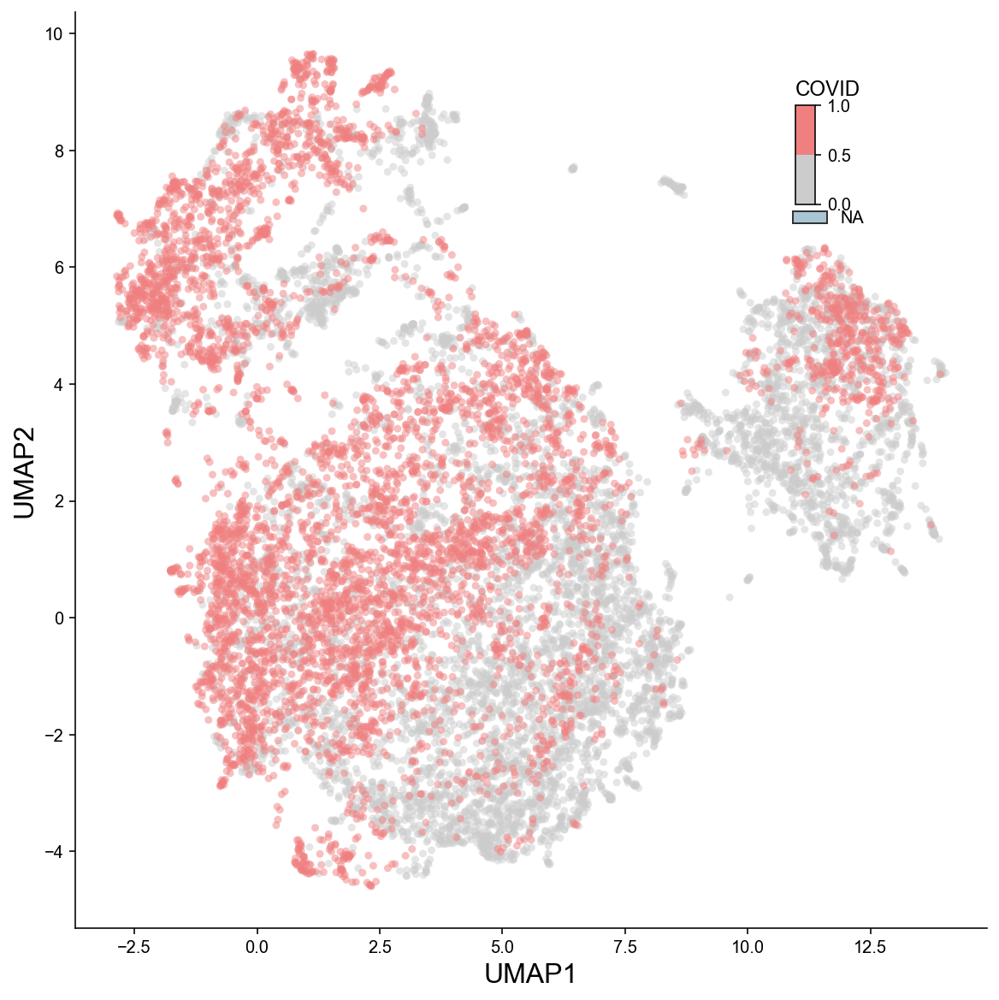

In [28]:
clustering.feature_plot(data, "COVID_status", "COVID", cmap=mpl.colors.ListedColormap(["#ccc", "lightcoral"]))
dump_figure('covid.pdf')

In [29]:
# set categorical order
data['Patient_category'] = pd.Categorical(data['Patient_category'],
                                   categories=['Non-Pneumonia Control', 'Other Pneumonia', 'Other Viral Pneumonia', 'COVID-19'],
                                   ordered=True)

Category_palette = [
    "tab:gray",
    "tab:blue",
    "forestgreen",
    "crimson",
]



In [30]:
data2 = data.copy()

In [31]:

color_map = {
     'Non-Pneumonia Control':'black',
     'Other Pneumonia':'lightgreen',
     'Other Viral Pneumonia':'lightblue',
     'COVID-19':'pink'
    }
     


In [32]:
data2['color'] = data['Patient_category'].map(color_map)

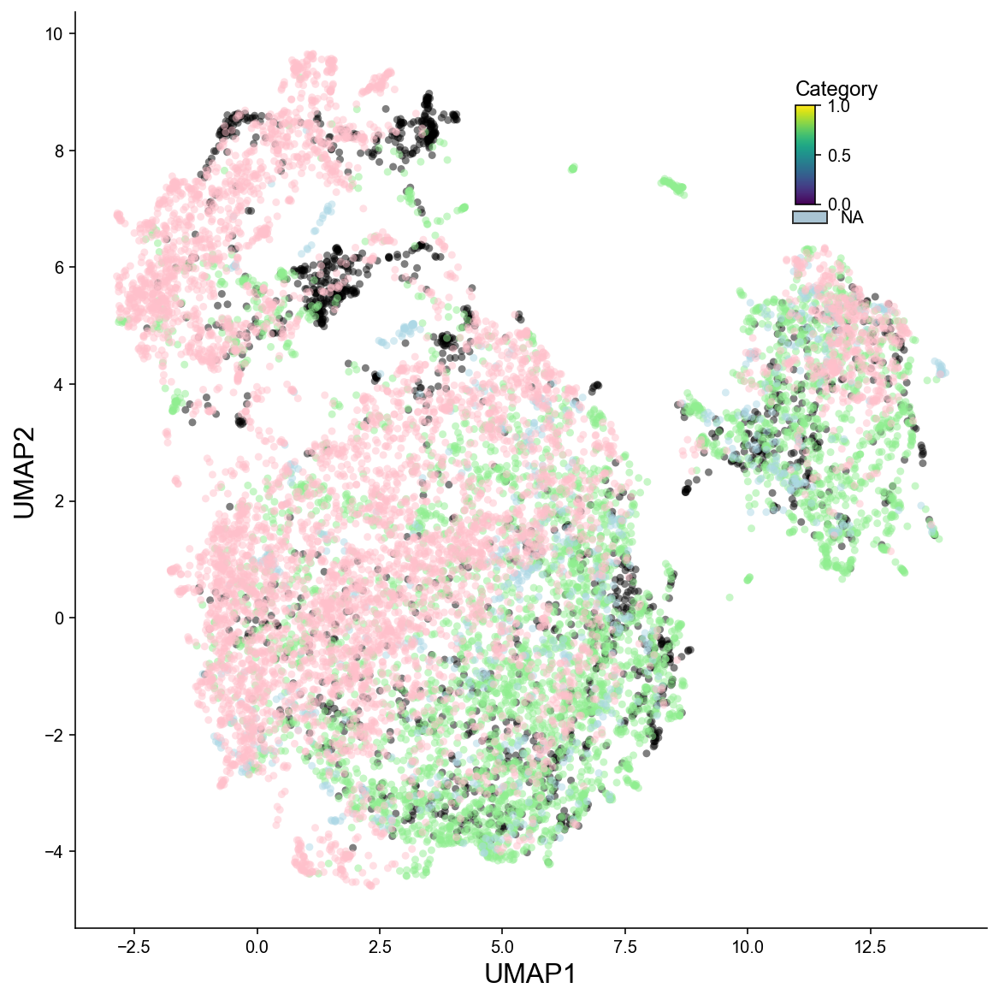

In [33]:
clustering.feature_plot(data2, "color", "Category")
dump_figure('category.pdf')

# Pathway plots

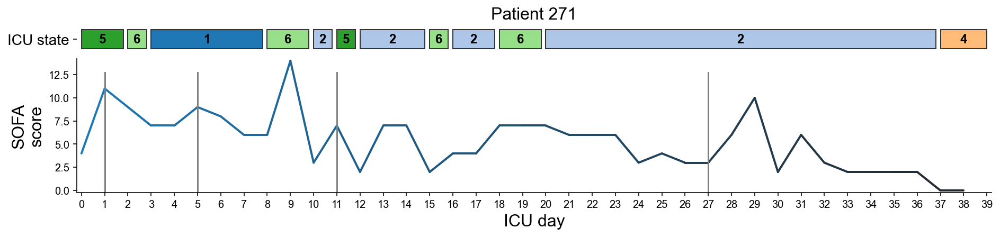

In [34]:
ax = clustering.plot_clinical_course(data, 271, line_color=mpl.cm.tab10.colors[0])
dump_figure('271_course.pdf')

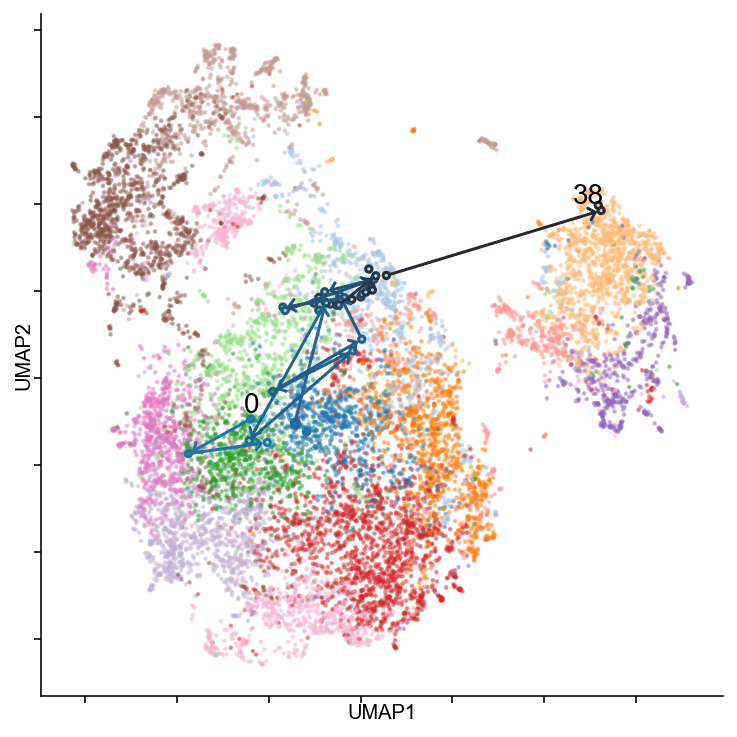

In [35]:
ax = clustering.plot_clinical_course_umap(data, 271, line_color=mpl.cm.tab10.colors[0], 
                          first_day_offset=(-7, 7), last_day_offset=(-25, 2))
dump_figure('271_umap.pdf')